# Appliance Energy Prediction
### Contributor : Md Ismail Quraishi

## Description:
The data set is at 10 min for about 4.5 months. The house temperature and humidity conditions were monitored with a ZigBee wireless sensor network. Each wireless node transmitted the temperature and humidity conditions around 3.3 min. Then, the wireless data was averaged for 10 minutes. The energy data was logged every 10 minutes with m-bus energy metres. Weather from the nearest airport weather station (Chievres Airport, Belgium) was downloaded from a public data set from Reliable Prognosis (rp5.ru) and merged together with the experimental data sets using the date and time column. Two random variables have been included in the data set for testing the regression models and to filter out non-predictive attributes. You need to predict the energy use of appliances.

## Know your data

In [1]:
# Imports
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from datetime import datetime
from sklearn.preprocessing import StandardScaler, Normalizer, MinMaxScaler, MaxAbsScaler, RobustScaler
import warnings
warnings.filterwarnings('ignore')

In [2]:
pd.set_option('display.max_columns', None)
path = './data/data_application_energy.csv'
df= pd.read_csv(path)
df.head(3)

,date,Appliances,lights,T1,RH_1,T2,RH_2,T3,RH_3,T4,RH_4,T5,RH_5,T6,RH_6,T7,RH_7,T8,RH_8,T9,RH_9,T_out,Press_mm_hg,RH_out,Windspeed,Visibility,Tdewpoint,rv1,rv2
0,2016-01-11 17:00:00,60,30,19.89,47.596667,19.2,44.790000,19.79,44.730000,19.000000,45.566667,17.166667,55.20,7.026667,84.256667,17.2,41.626667,18.2,48.900000,17.033333,45.53,6.600000,733.5,92.0,7.000000,63.000000,5.3,13.275433,13.275433
1,2016-01-11 17:10:00,60,30,19.89,46.693333,19.2,44.722500,19.79,44.790000,19.000000,45.992500,17.166667,55.20,6.833333,84.063333,17.2,41.560000,18.2,48.863333,17.066667,45.56,6.483333,733.6,92.0,6.666667,59.166667,5.2,18.606195,18.606195
2,2016-01-11 17:20:00,50,30,19.89,46.300000,19.2,44.626667,19.79,44.933333,18.926667,45.890000,17.166667,55.09,6.560000,83.156667,17.2,41.433333,18.2,48.730000,17.000000,45.50,6.366667,733.7,92.0,6.333333,55.333333,5.1,28.642668,28.642668


In [3]:
# Know your data
class KYD:
    def __init__(self, data): # init function/ constructor
        self.data=data
        self.tSeries,self.rhSeries= [],[] # List initialization
        for i in range(1,10): # Loop for appending Tseries and RHseries
            self.tSeries.append('T'+str(i)) # Appending tSeries
            self.rhSeries.append('RH_'+str(i)) # Appending rhSeries
    def sdci(self): # This function displays shape, columns and info of the data
        ''' sdci stands for shape, duplicates, columns, and info '''
        print('Shape: ', self.data.shape)
        print()
        print('Duplicates: ',self.data.duplicated().sum())
        print()
        print('Columns: ', list(self.data.columns))
        print()
        print('Info:')
        print(self.data.info())
    # This function returns a dataframe with the details of null values
    def null_checker(self):
        ''' returns null values for the dataset '''
        null_df = self.data.isna().sum()
        null_df = pd.DataFrame(null_df)
        null_df.rename(columns={0:'count'}, inplace=True)
        null_df['null_pct']= null_df['count']/len(self.data)
        return null_df   
    # This function returns unique count for each features
    def get_unique(self):
        ''' returns unique values for each column '''
        unique_dict= {}
        for col in self.data.columns:
            unique_dict[col]= self.data[col].unique()
        return unique_dict
# Object creation
kyd= KYD(df)

In [4]:
kyd.sdci()

Shape:  (19735, 29)

Duplicates:  0

Columns:  ['date', 'Appliances', 'lights', 'T1', 'RH_1', 'T2', 'RH_2', 'T3', 'RH_3', 'T4', 'RH_4', 'T5', 'RH_5', 'T6', 'RH_6', 'T7', 'RH_7', 'T8', 'RH_8', 'T9', 'RH_9', 'T_out', 'Press_mm_hg', 'RH_out', 'Windspeed', 'Visibility', 'Tdewpoint', 'rv1', 'rv2']

Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19735 entries, 0 to 19734
Data columns (total 29 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   date         19735 non-null  object 
 1   Appliances   19735 non-null  int64  
 2   lights       19735 non-null  int64  
 3   T1           19735 non-null  float64
 4   RH_1         19735 non-null  float64
 5   T2           19735 non-null  float64
 6   RH_2         19735 non-null  float64
 7   T3           19735 non-null  float64
 8   RH_3         19735 non-null  float64
 9   T4           19735 non-null  float64
 10  RH_4         19735 non-null  float64
 11  T5           19735 non-null  float64
 1

In [5]:
print(kyd.null_checker())

             count  null_pct
date             0       0.0
Appliances       0       0.0
lights           0       0.0
T1               0       0.0
RH_1             0       0.0
T2               0       0.0
RH_2             0       0.0
T3               0       0.0
RH_3             0       0.0
T4               0       0.0
RH_4             0       0.0
T5               0       0.0
RH_5             0       0.0
T6               0       0.0
RH_6             0       0.0
T7               0       0.0
RH_7             0       0.0
T8               0       0.0
RH_8             0       0.0
T9               0       0.0
RH_9             0       0.0
T_out            0       0.0
Press_mm_hg      0       0.0
RH_out           0       0.0
Windspeed        0       0.0
Visibility       0       0.0
Tdewpoint        0       0.0
rv1              0       0.0
rv2              0       0.0


In [6]:
print(kyd.get_unique())

{'date': array(['2016-01-11 17:00:00', '2016-01-11 17:10:00',
       '2016-01-11 17:20:00', ..., '2016-05-27 17:40:00',
       '2016-05-27 17:50:00', '2016-05-27 18:00:00'], dtype=object), 'Appliances': array([  60,   50,   70,  230,  580,  430,  250,  100,   90,   80,  140,
        120,  190,  110,  400,  390,  240,   40,   30,  310,  380,  370,
         20,  260,  500,  450,  220,  170,  290,  130,  200,  210,  180,
        350,  300,  340,  150,  330,  420,  520,  360,  270,  550,  690,
        620,  610,  490,  410,  320,  740,  910,  510,  790,  460,  160,
        480,  280,  560, 1080,  750,  470,  440,  800,  540,  530,  660,
        630,  600,   10,  570,  830, 1070,  890,  590,  850,  710,  680,
        670,  780,  640,  650,  700,  770,  720,  760,  860,  880,  730,
        900,  820,  870,  840], dtype=int64), 'lights': array([30, 40, 50, 70, 60, 10, 20,  0], dtype=int64), 'T1': array([19.89      , 19.85666667, 19.79      , 19.92666667, 20.06666667,
       20.13333333, 20.26

In [7]:
print(kyd.data.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19735 entries, 0 to 19734
Data columns (total 29 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   date         19735 non-null  object 
 1   Appliances   19735 non-null  int64  
 2   lights       19735 non-null  int64  
 3   T1           19735 non-null  float64
 4   RH_1         19735 non-null  float64
 5   T2           19735 non-null  float64
 6   RH_2         19735 non-null  float64
 7   T3           19735 non-null  float64
 8   RH_3         19735 non-null  float64
 9   T4           19735 non-null  float64
 10  RH_4         19735 non-null  float64
 11  T5           19735 non-null  float64
 12  RH_5         19735 non-null  float64
 13  T6           19735 non-null  float64
 14  RH_6         19735 non-null  float64
 15  T7           19735 non-null  float64
 16  RH_7         19735 non-null  float64
 17  T8           19735 non-null  float64
 18  RH_8         19735 non-null  float64
 19  T9  

In [8]:
kyd.data.describe()

,Appliances,lights,T1,RH_1,T2,RH_2,T3,RH_3,T4,RH_4,T5,RH_5,T6,RH_6,T7,RH_7,T8,RH_8,T9,RH_9,T_out,Press_mm_hg,RH_out,Windspeed,Visibility,Tdewpoint,rv1,rv2
count,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000
mean,97.694958,3.801875,21.686571,40.259739,20.341219,40.420420,22.267611,39.242500,20.855335,39.026904,19.592106,50.949283,7.910939,54.609083,20.267106,35.388200,22.029107,42.936165,19.485828,41.552401,7.411665,755.522602,79.750418,4.039752,38.330834,3.760707,24.988033,24.988033
std,102.524891,7.935988,1.606066,3.979299,2.192974,4.069813,2.006111,3.254576,2.042884,4.341321,1.844623,9.022034,6.090347,31.149806,2.109993,5.114208,1.956162,5.224361,2.014712,4.151497,5.317409,7.399441,14.901088,2.451221,11.794719,4.194648,14.496634,14.496634
min,10.000000,0.000000,16.790000,27.023333,16.100000,20.463333,17.200000,28.766667,15.100000,27.660000,15.330000,29.815000,-6.065000,1.000000,15.390000,23.200000,16.306667,29.600000,14.890000,29.166667,-5.000000,729.300000,24.000000,0.000000,1.000000,-6.600000,0.005322,0.005322
25%,50.000000,0.000000,20.760000,37.333333,18.790000,37.900000,20.790000,36.900000,19.530000,35.530000,18.277500,45.400000,3.626667,30.025000,18.700000,31.500000,20.790000,39.066667,18.000000,38.500000,3.666667,750.933333,70.333333,2.000000,29.000000,0.900000,12.497889,12.497889
50%,60.000000,0.000000,21.600000,39.656667,20.000000,40.500000,22.100000,38.530000,20.666667,38.400000,19.390000,49.090000,7.300000,55.290000,20.033333,34.863333,22.100000,42.375000,19.390000,40.900000,6.916667,756.100000,83.666667,3.666667,40.000000,3.433333,24.897653,24.897653
75%,100.000000,0.000000,22.600000,43.066667,21.500000,43.260000,23.290000,41.760000,22.100000,42.156667,20.619643,53.663333,11.256000,83.226667,21.600000,39.000000,23.390000,46.536000,20.600000,44.338095,10.408333,760.933333,91.666667,5.500000,40.000000,6.566667,37.583769,37.583769
max,1080.000000,70.000000,26.260000,63.360000,29.856667,56.026667,29.236000,50.163333,26.200000,51.090000,25.795000,96.321667,28.290000,99.900000,26.000000,51.400000,27.230000,58.780000,24.500000,53.326667,26.100000,772.300000,100.000000,14.000000,66.000000,15.500000,49.996530,49.996530


In [9]:
# Check whether rv1 and rv2 are identical.
print(len(kyd.data[kyd.data['rv1']!=kyd.data['rv2']]))

0


1. There are 19735 rows and 29 columns without any duplicate or null values.
2. Columns rv1 and rv2 are identical therefore we need to drop one of them.
3. All the columns are in right formate exept date, later I will convert that column from object to datetime formate.
4. There are huge difference between mean and median for the column Appliances, lights that indicates there are outliers present.

## Data Wrangling

In [10]:
# Data wrangling
class DataWrangling(KYD):
    def dateTimeConvertor(self): # Function for datetime conversion
        self.data['date_converted']= self.data['date'].apply(lambda x: datetime.strptime(x, '%Y-%m-%d %H:%M:%S'))
        self.data.drop(columns= ['date'], inplace=True)
    # dataWrangling main function
    def dataWrangling(self):
        self.dateTimeConvertor() # Convert date from object to date
        self.data.drop(columns=['rv2'], inplace=True) # Drop rv2 because rv1 and rv2 both are same identical columns
# Create object
dataWrangling = DataWrangling(df.copy())
dataWrangling.dataWrangling() # calling dataWrangling method

## Data Visualization

#### Uni-variate

In [11]:
# Data Visualization
plt.rcParams['figure.figsize']= (12,5)
df_wrangle= dataWrangling.data

##### Chart 1- Dependent variable distributions

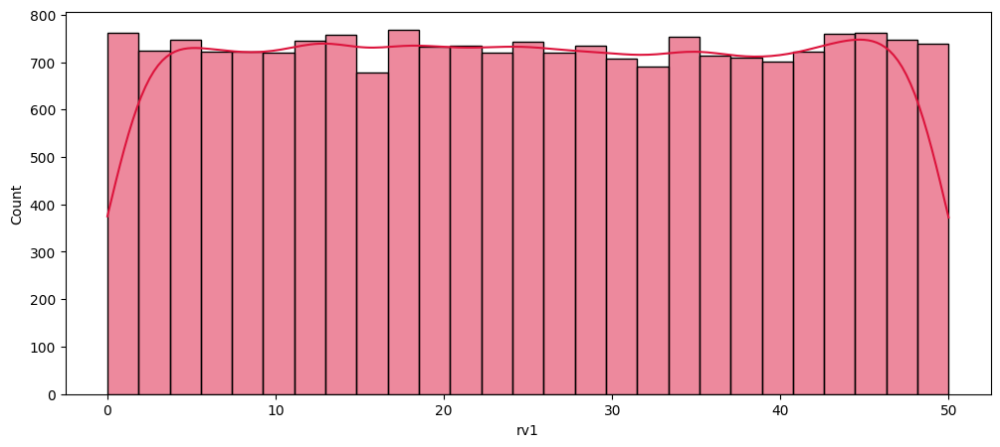

In [12]:
sns.histplot(data=df_wrangle['rv1'],color='crimson',kde=True)
plt.show()

##### Chart- 2 - Distribution plot for T1-T9

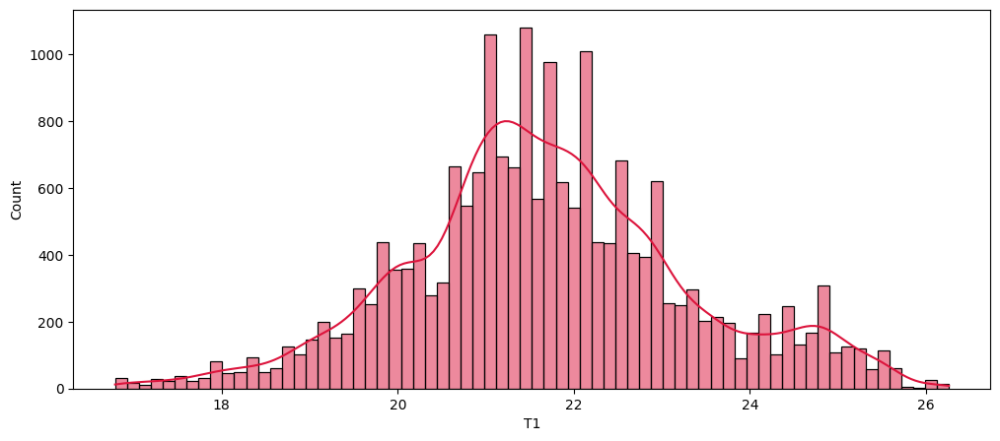

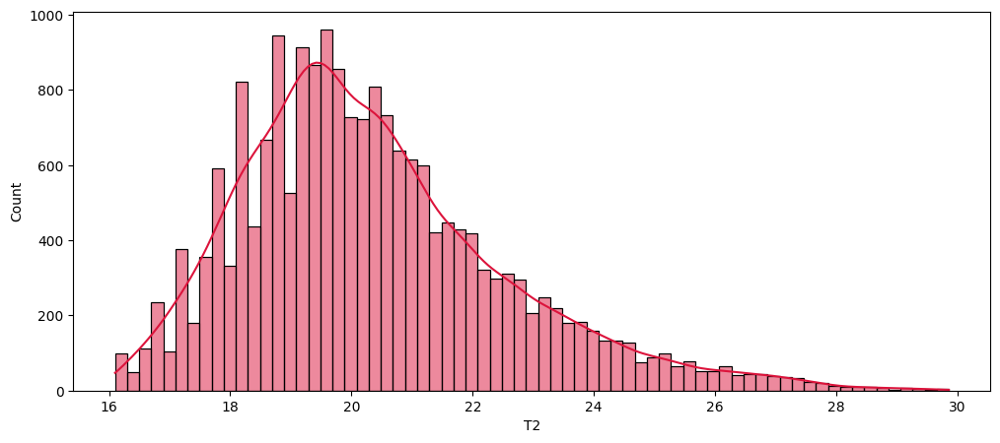

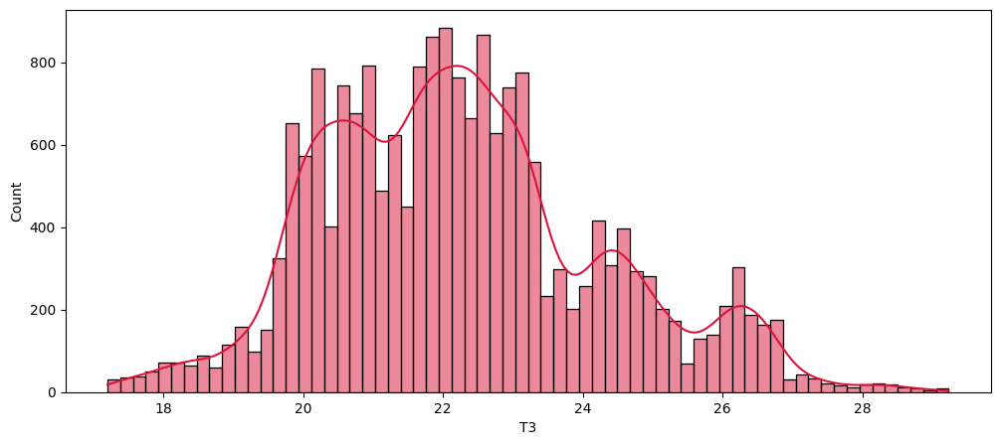

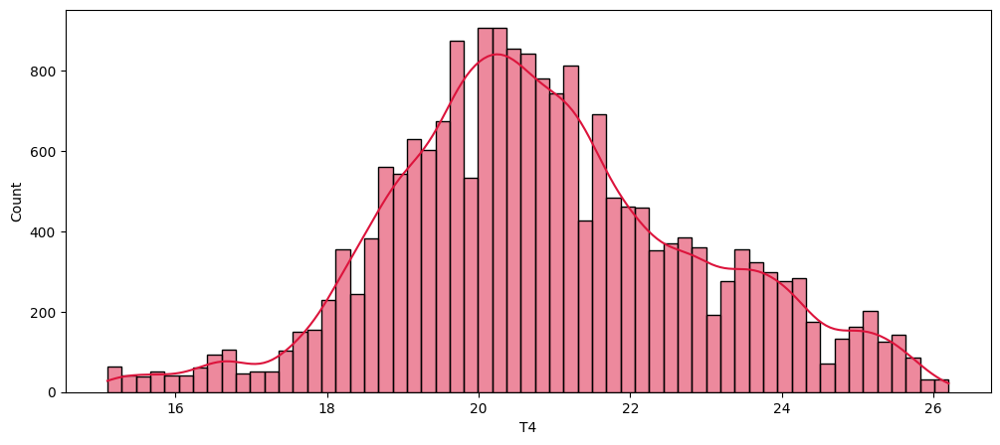

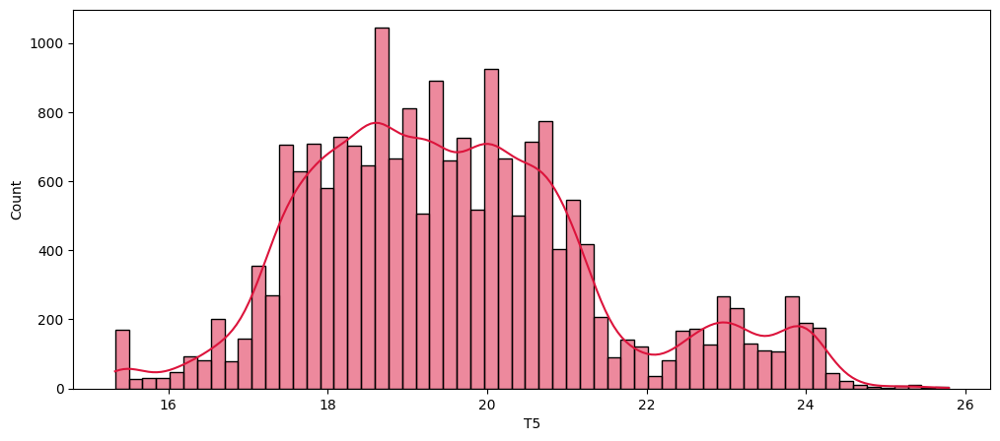

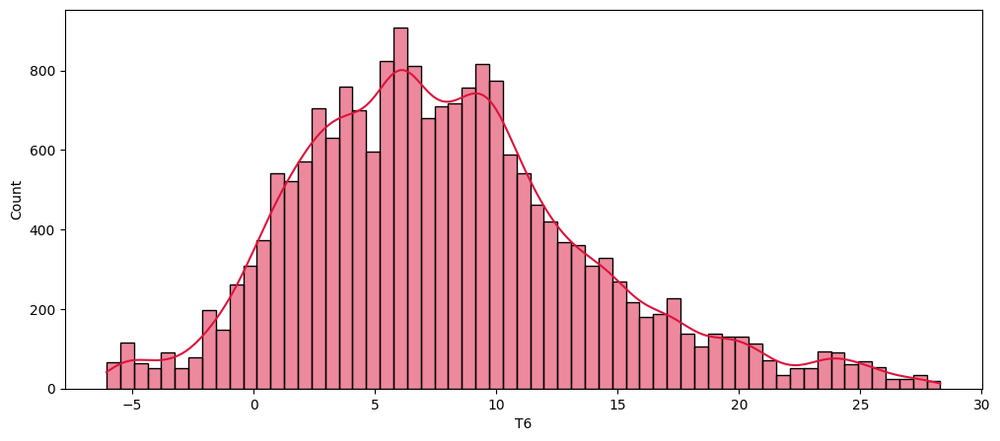

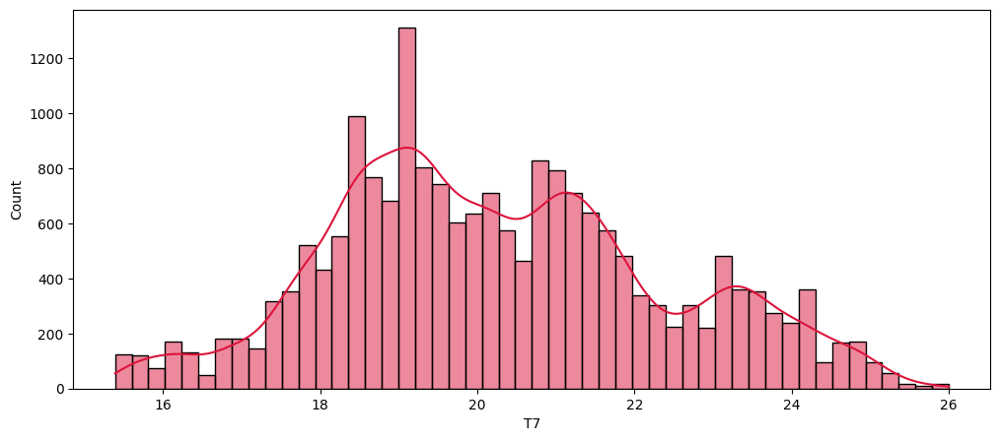

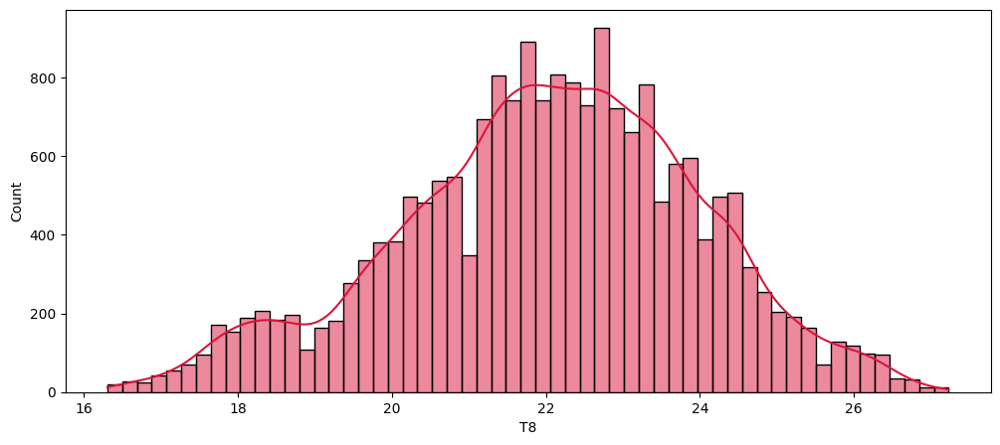

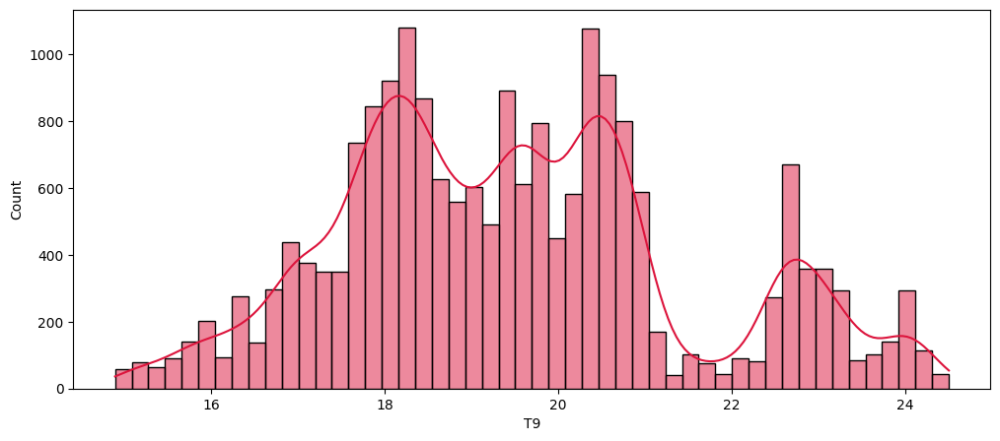

In [13]:
for i in range(1, 10):
    temp= 'T'+str(i)
    sns.histplot(df_wrangle[temp], color='crimson', kde=True)
    plt.show()

Distribution for T1,T2,T3,T4,T5,T6,T7,T8,T9  almost normal.

##### Chart - 5 - Distribution for T_out 

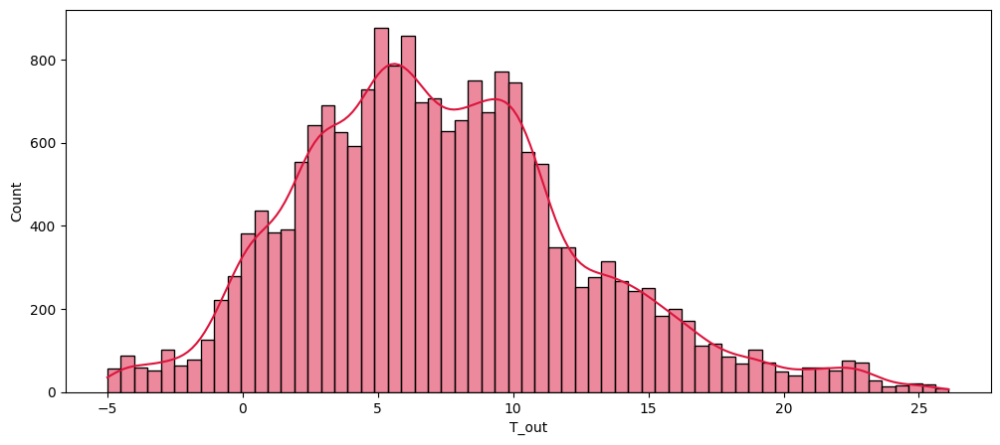

In [14]:
sns.histplot(df_wrangle['T_out'], color='crimson', kde=True)
plt.show()

T_out is normally distributed, ideal for model building.

#####  Chart - 6 - Distribution plot for 'RH_1', 'RH_2', 'RH_3', 'RH_4', 'RH_5', 'RH_6', 'RH_7', 'RH_8', 'RH_9'.

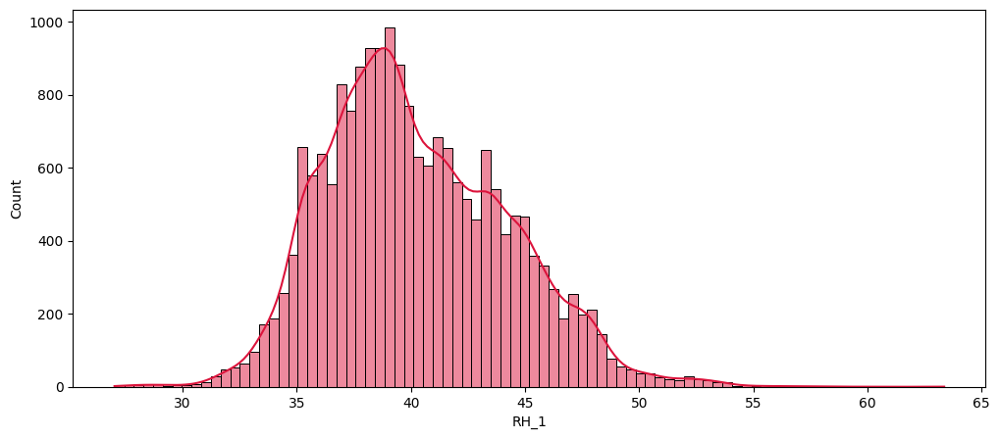

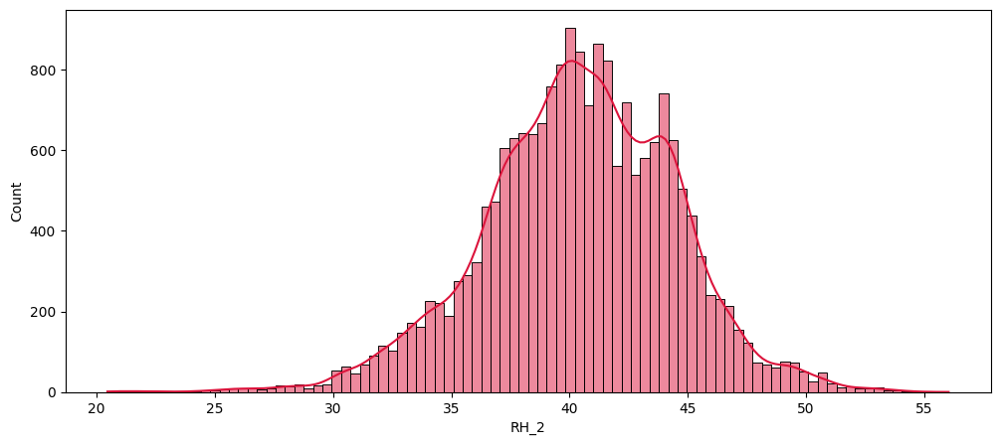

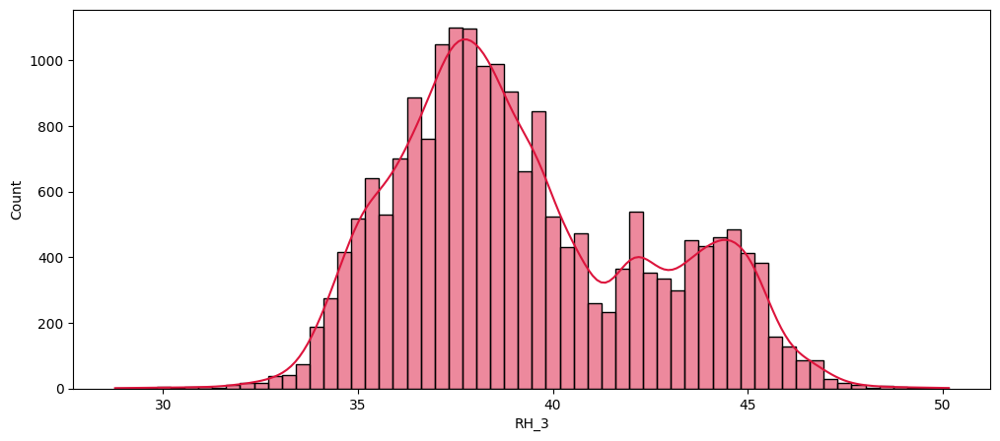

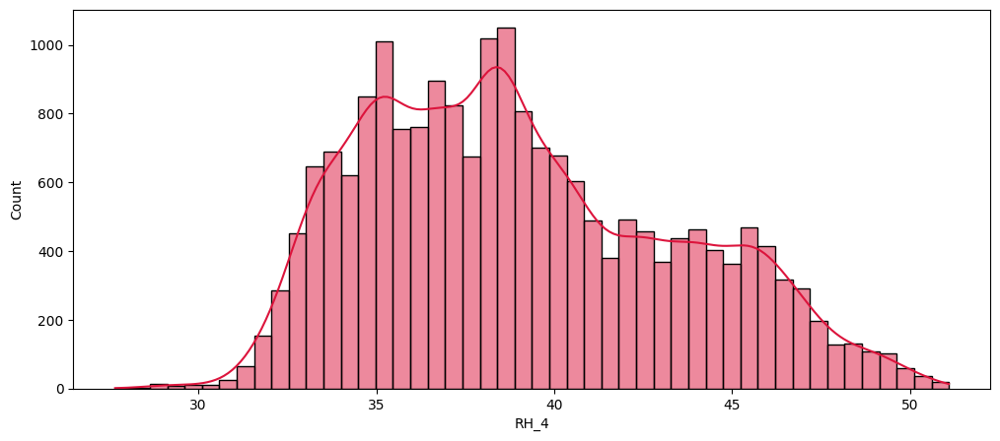

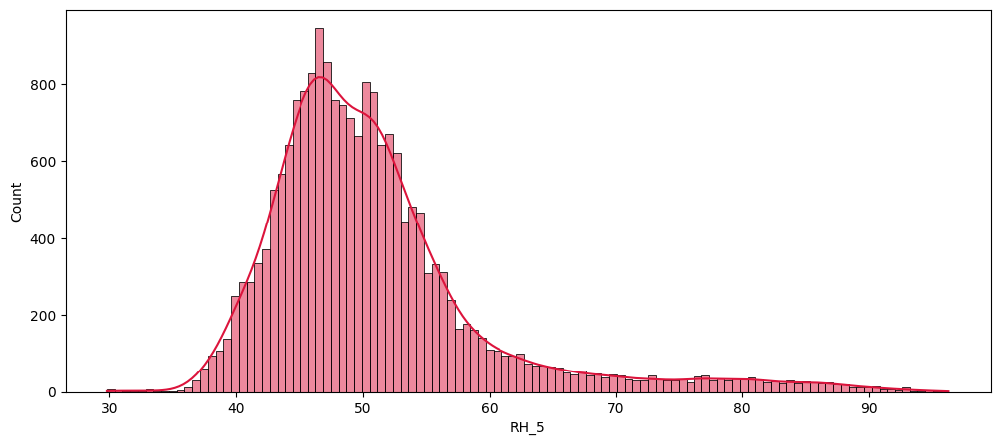

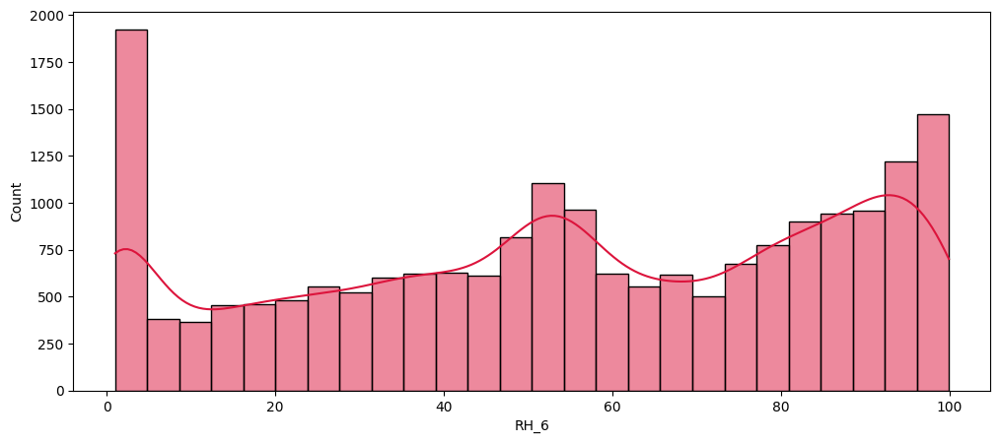

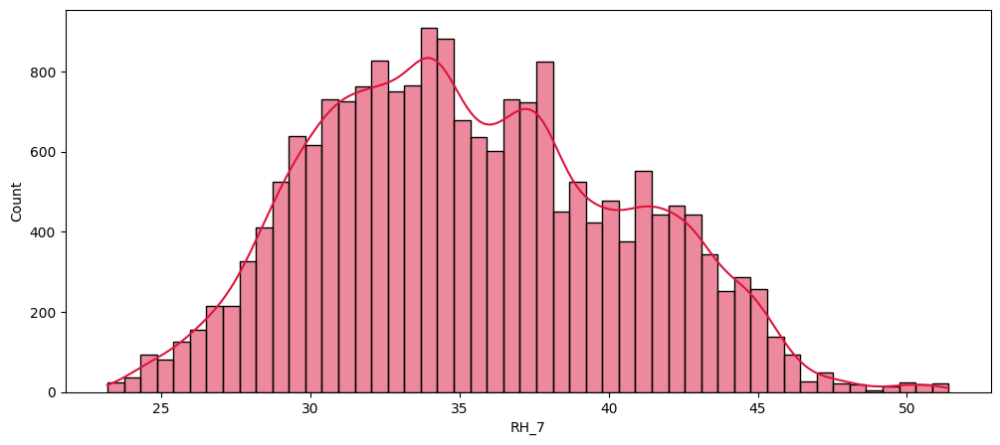

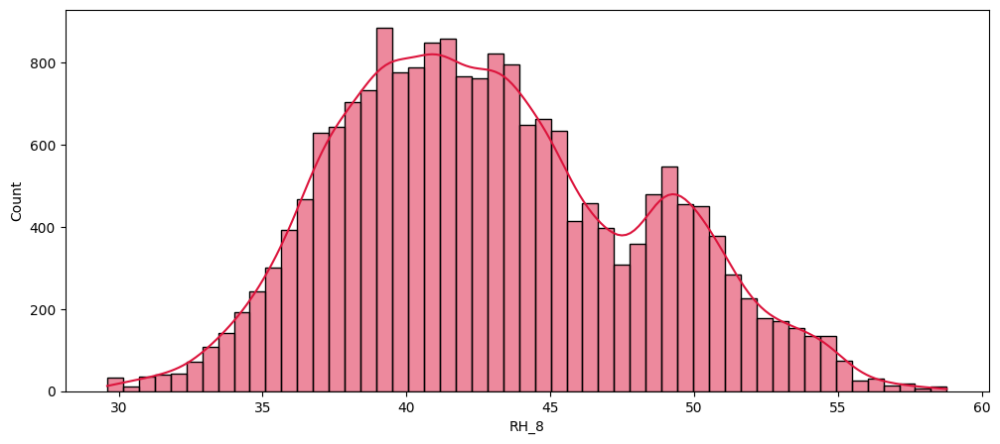

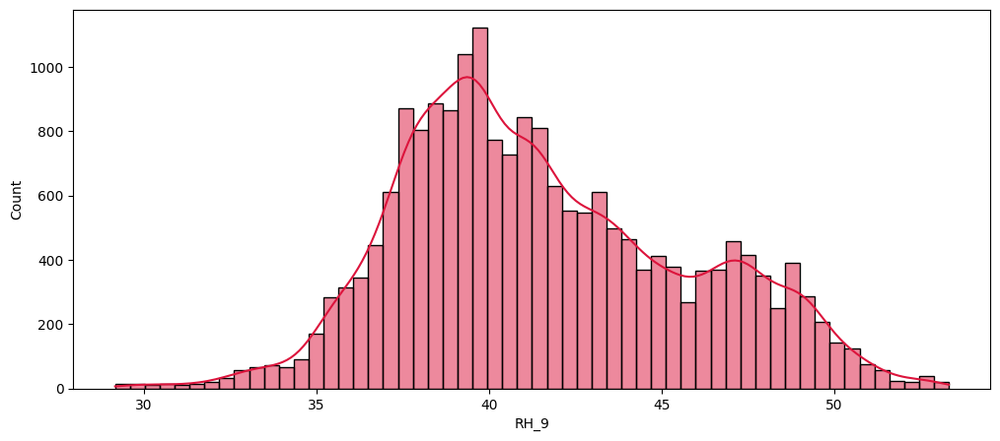

In [15]:
for i in range(1, 10):
    temp= 'RH_'+str(i)
    sns.histplot(df_wrangle[temp], color='crimson', kde=True)
    plt.show()

All rh series are almost normally distributed, ideal for model building.

##### Chart - 7 - Distribution for RH_out

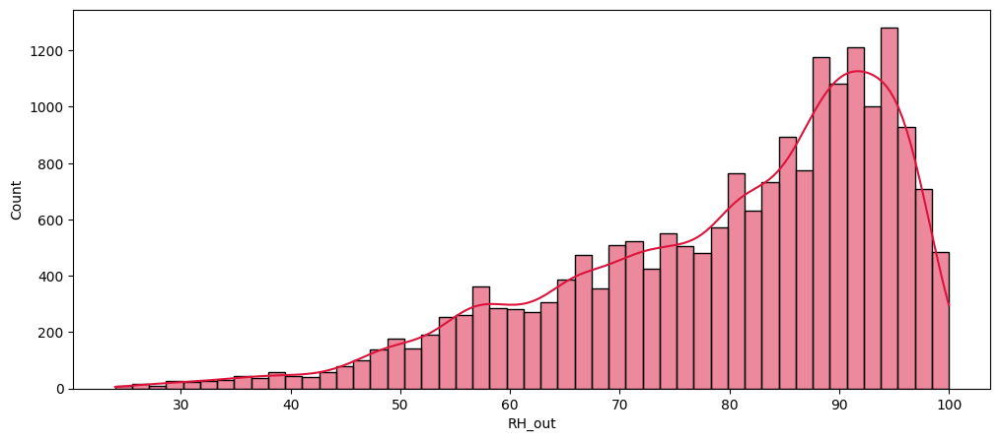

In [16]:
sns.histplot(df_wrangle['RH_out'], color='crimson', kde=True)
plt.show()

RH_out is negatively distributed, we will treat it later.

##### Chart - 8 - Histplot for Press_mm_hg

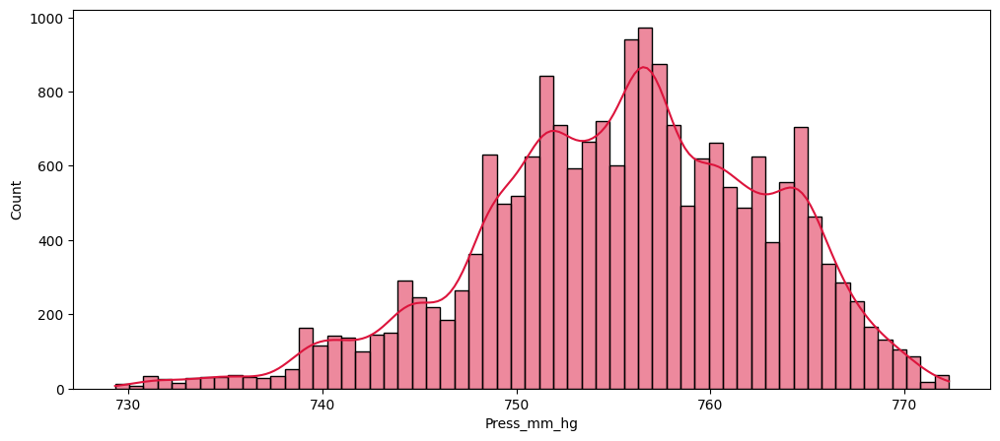

In [17]:
sns.histplot(df_wrangle['Press_mm_hg'], color='crimson', kde=True)
plt.show()

Press_mm_hg is almost normally distributed, ideal for model building.

##### Chart - 9 - Histplot for Windspeed

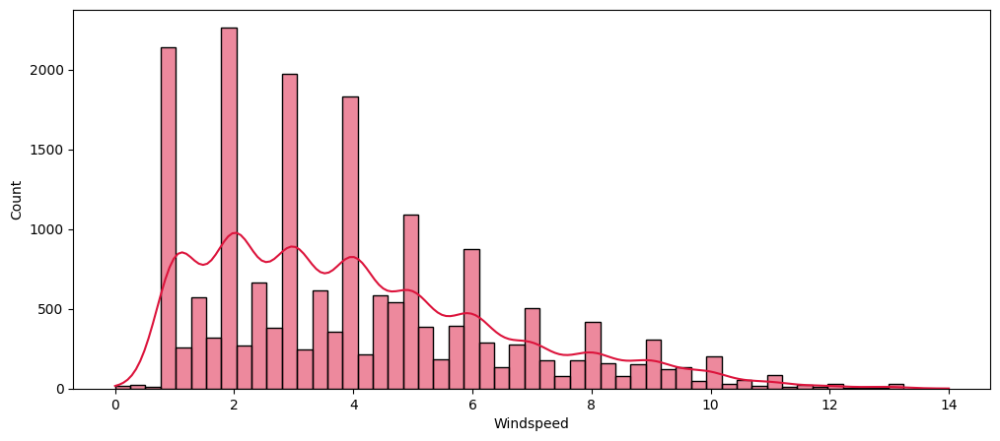

In [18]:
sns.histplot(df_wrangle['Windspeed'], color='crimson', kde=True)
plt.show()

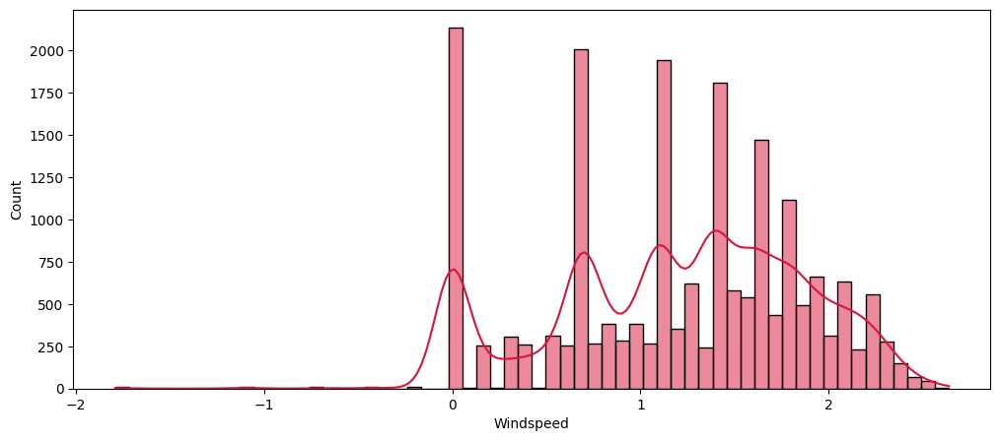

In [19]:
sns.histplot(np.log(df_wrangle['Windspeed']), color='crimson', kde=True)
plt.show()

In fig1 Windspeed is positively distributed, we need to transform it for model building, look the transformation in fig2.

##### Chart - 10 - Histplot for Tdewpoint

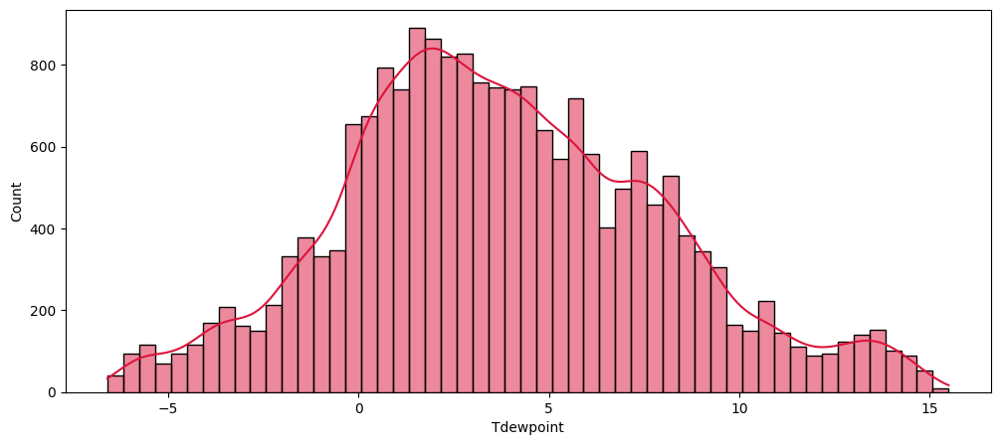

In [20]:
sns.histplot(df_wrangle['Tdewpoint'], color='crimson', kde=True)
plt.show()

Fine and ideal for model building.

##### Chart - 11 - Histplot for Visibility 

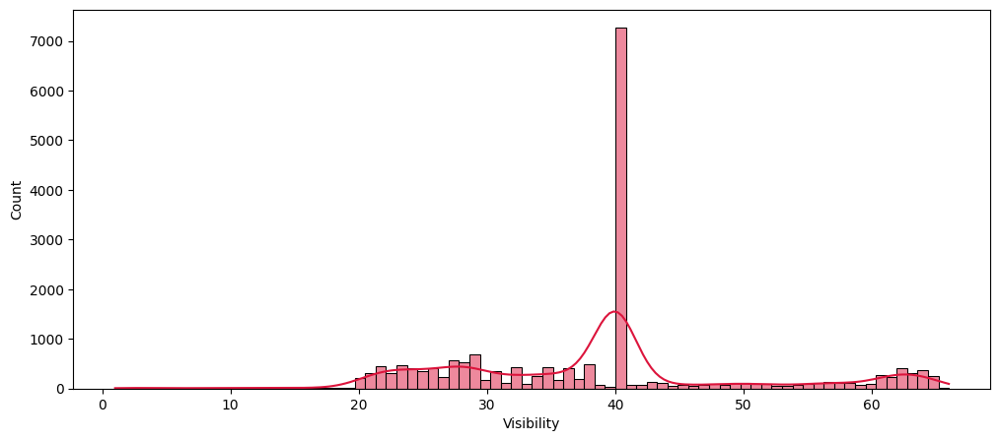

In [21]:
sns.histplot(df_wrangle['Visibility'], color='crimson', kde=True)
plt.show()

#### Bi-variate

##### Chart - 1 - Pairplots

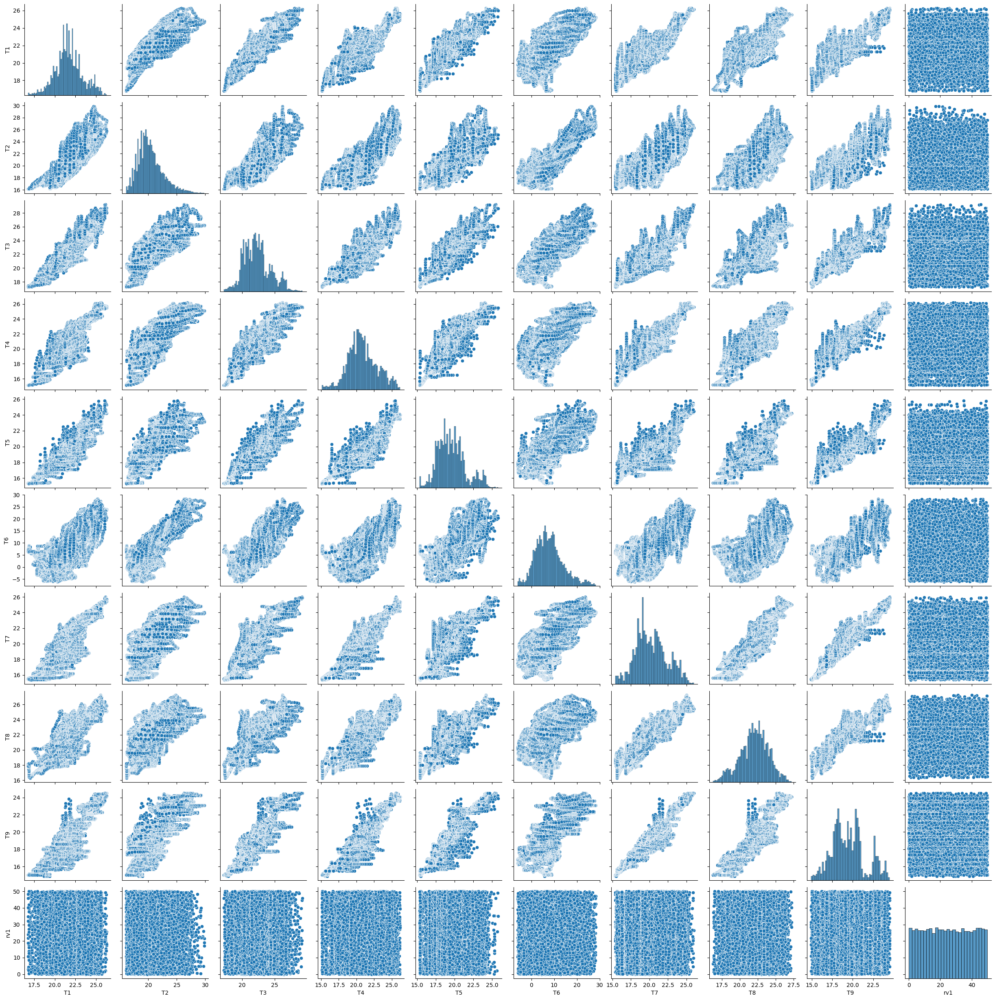

In [22]:
Tsries= ['T1', 'T2', 'T3', 'T4', 'T5', 'T6', 'T7', 'T8', 'T9','rv1']
sns.pairplot(df_wrangle[Tsries])
plt.show()

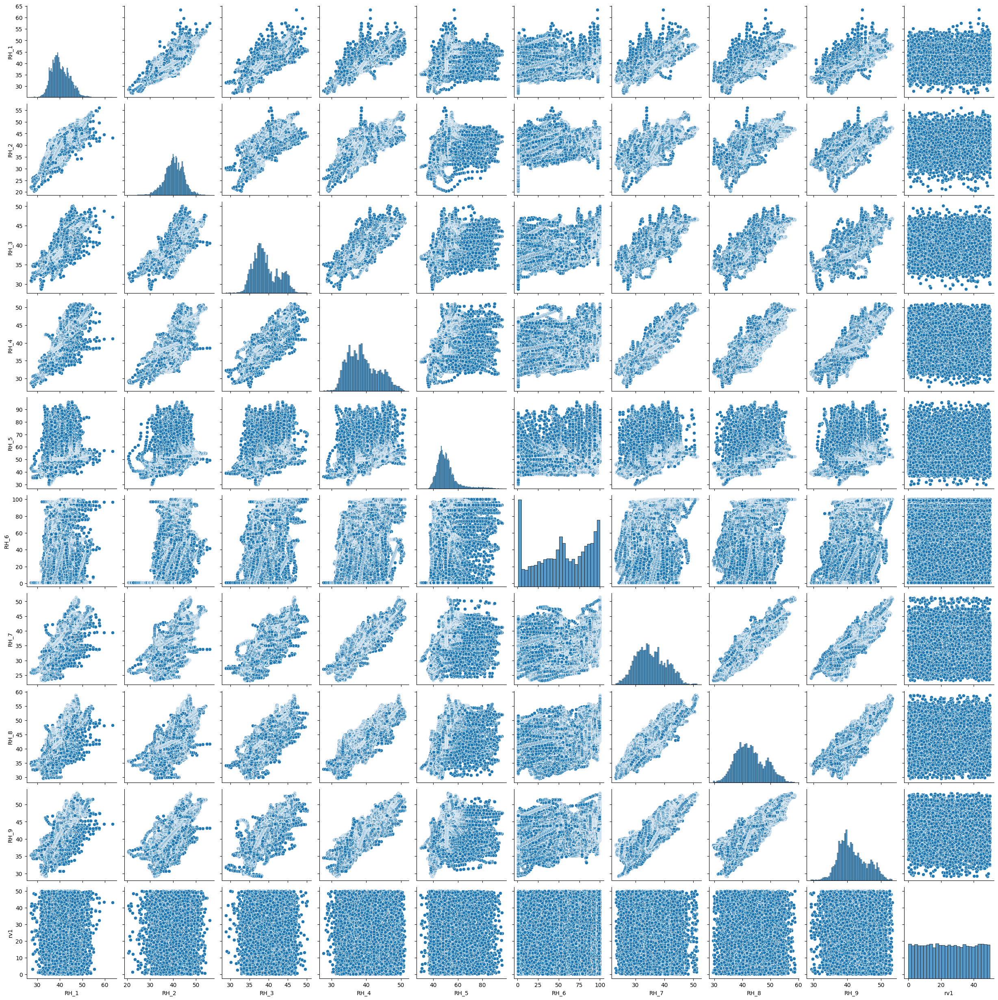

In [23]:
rhSeries= ['RH_1', 'RH_2', 'RH_3', 'RH_4', 'RH_5', 'RH_6', 'RH_7', 'RH_8', 'RH_9','rv1']
sns.pairplot(df_wrangle[rhSeries])
plt.show()

#### Heatmap

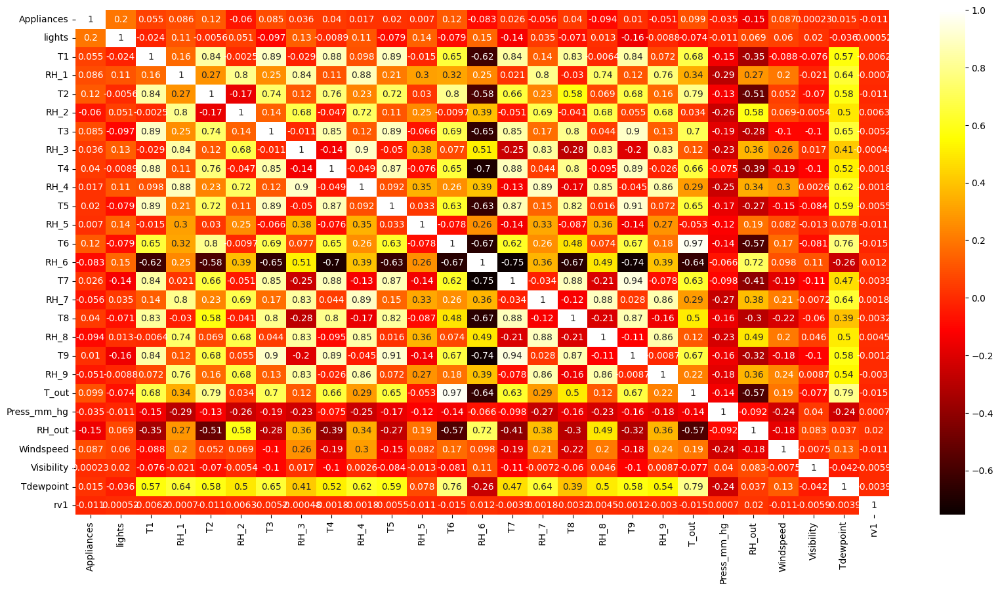

In [24]:
corr= df_wrangle.drop(columns=['date_converted']).corr()
plt.rcParams['figure.figsize']= (20,10)
sns.heatmap(corr, annot=True, cmap='hot')
plt.show()

#### Date-wise visualization

In [25]:
plt.rcParams['figure.figsize']= (10,5)
df_wrangle['day']= df_wrangle['date_converted'].apply(lambda x: x.day)
df_wrangle['month']= df_wrangle['date_converted'].apply(lambda x: x.month)
df_wrangle['year']= df_wrangle['date_converted'].apply(lambda x: x.year)

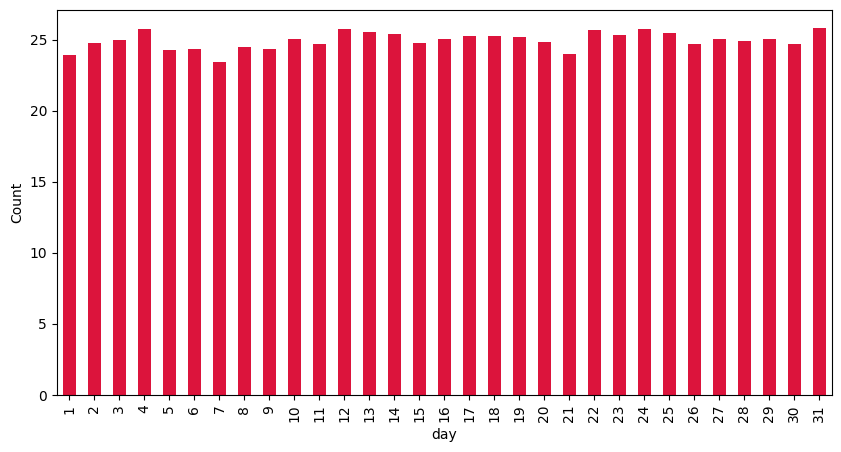

In [26]:
df_wrangle.groupby(['day'])['rv1'].mean().plot.bar(color=['crimson'])
plt.ylabel('Count')
plt.show()

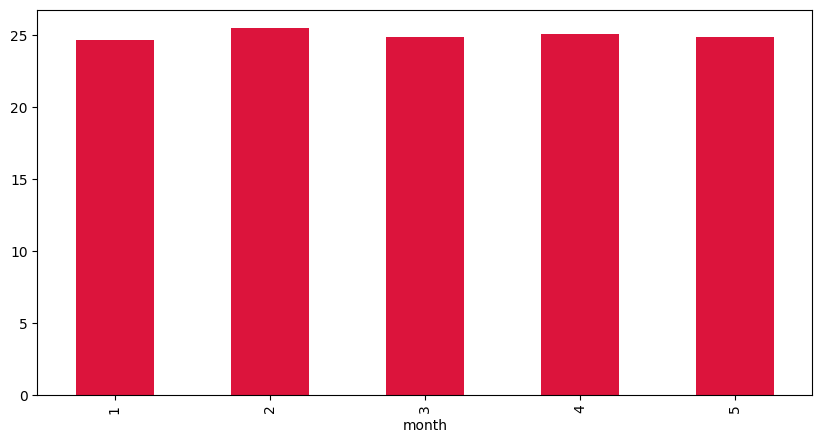

In [27]:
df_wrangle.groupby(['month'])['rv1'].mean().plot.bar(color=['crimson'])
plt.show()

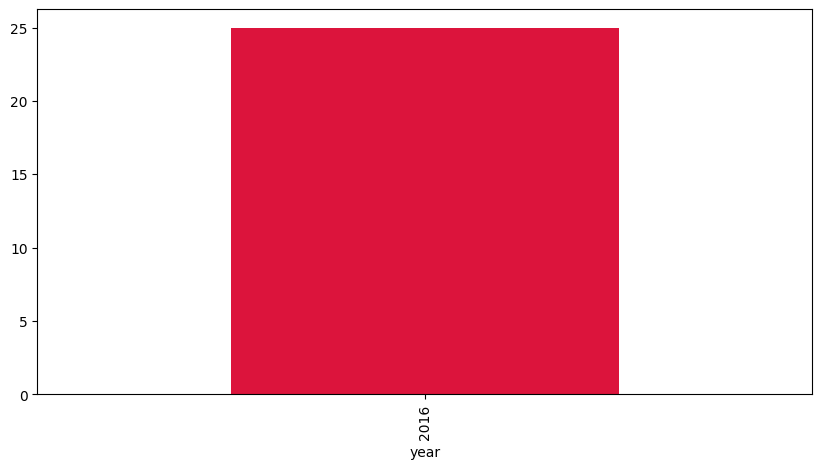

In [28]:
df_wrangle.groupby(['year'])['rv1'].mean().plot.bar(color=['crimson'])
plt.show()

From the above figures we observed that date is not helpful for making prediction.

#### Pairplot for RH_out, T_out, Press_mm_hg, Windspeed, Visibility.

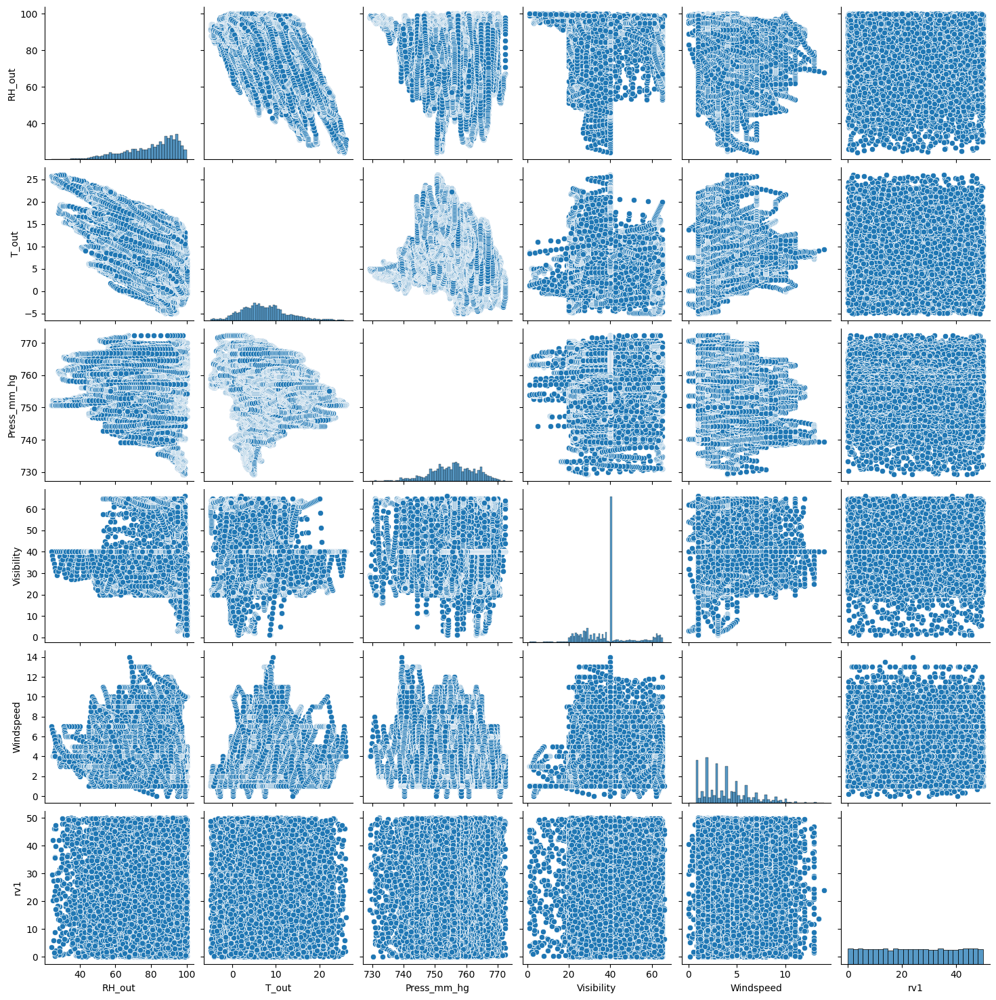

In [29]:
sns.pairplot(df_wrangle[['RH_out','T_out','Press_mm_hg','Visibility','Windspeed','rv1']])
plt.show()

#### Barplot for Press_mm_hg

<Axes: xlabel='Press_mm_hg'>

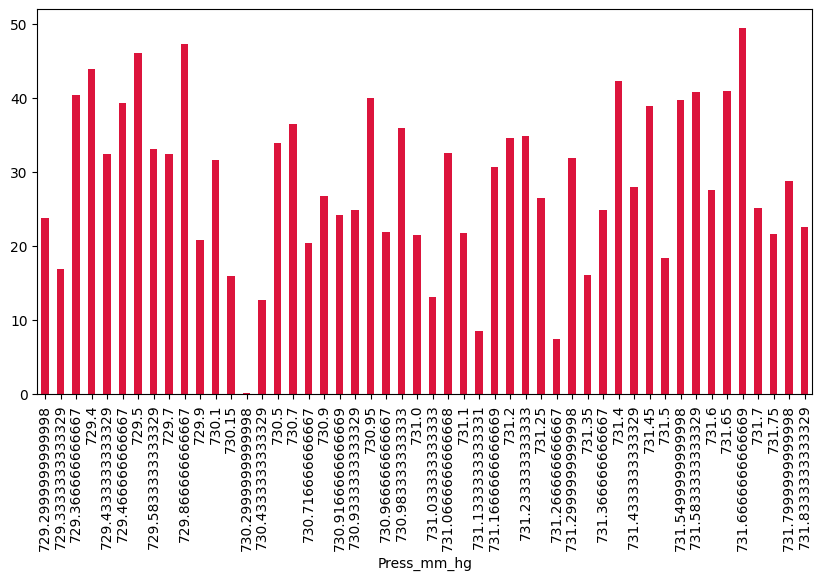

In [30]:
df_wrangle.groupby(['Press_mm_hg'])['rv1'].mean().head(50).plot.bar(color=['crimson'])

This pattern shows that Press_mm_hg might be helpful for the model during prediction.

#### Barplot for Windspeed

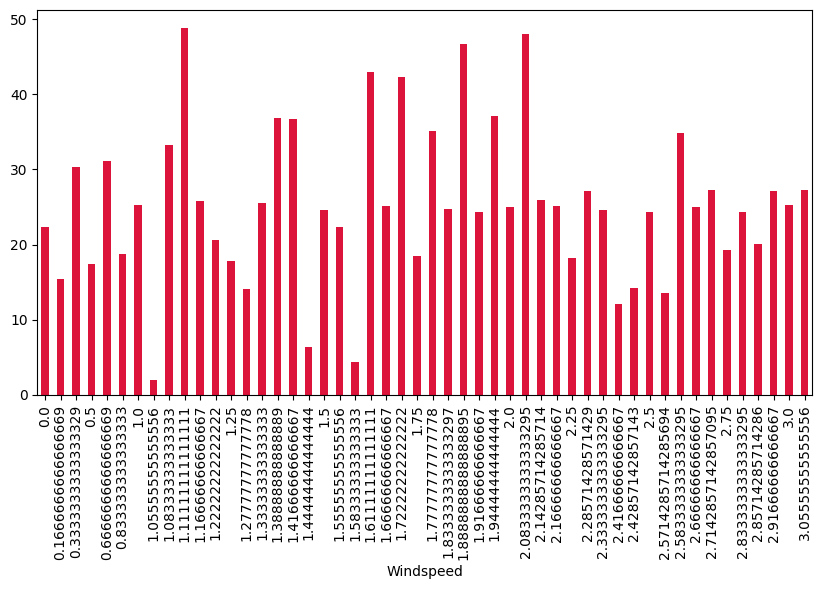

In [31]:
df_wrangle.groupby(['Windspeed'])['rv1'].mean().head(50).plot.bar(color=['crimson'])
plt.show()

#### Barplot for Visibility

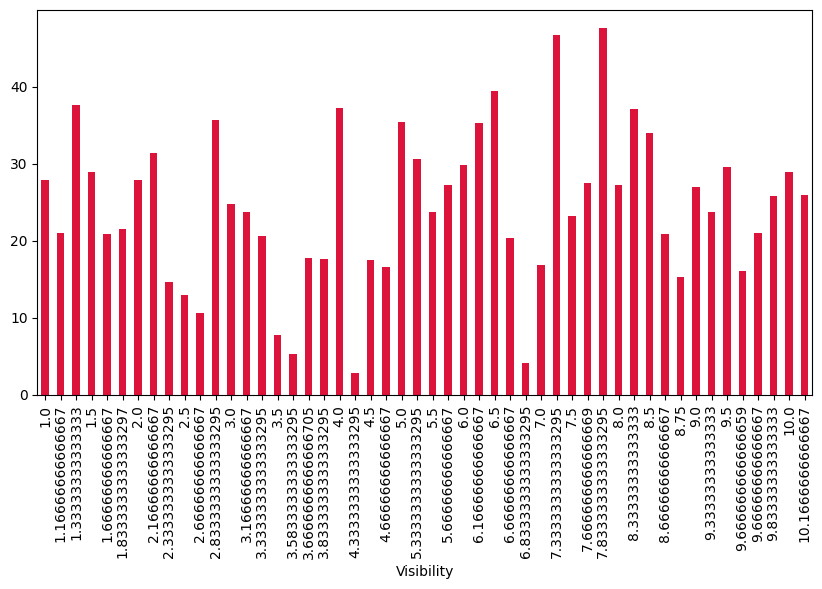

In [32]:
df_wrangle.groupby(['Visibility'])['rv1'].mean().head(50).plot.bar(color=['crimson'])
plt.show()

Press_mm_hg, windspeed, visibility, Tdewpoint

## Preprocessing

1. rhout - negatively dist
2. Windspeed - possitive
3. 

Steps:
1. drop date
2. take mean of Tseries
3. take mean of rvSeries
4. drop both the above
5. lishts = categorical
6. 

In [33]:
class Preprocessing(DataWrangling):
    def drop_unwanted_cols(self): # Function for deletting unwanted columns
        self.data.drop(columns= ['date_converted', 'day', 'month', 'year'], inplace=True) # Dropping date features
        self.data.drop(columns= self.tSeries, inplace=True)
        self.data.drop(columns= self.rhSeries, inplace=True)
        self.data.drop(columns= ['lights'], inplace=True)